### Create a machine learning model that can predict the genre of a movie based on its plot summary or other textual information. You can use techniques like TF-IDF or word embeddings with classifiers such as Naive Bayes, Logistic Regression, or Support Vector Machines.

### Dataset :  https://www.kaggle.com/datasets/hijest/genre-classification-dataset-imdb

Import Packages

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud

In [37]:
import os
cwd = os.getcwd() 
      
print("Current working directory:", cwd) 

Current working directory: /Users/saahilbasak/Code/DataScience/Codesoft/Movie


In [38]:
import nltk

# Set the custom download path for NLTK data
custom_download_path = 'kaggle/'

# Make sure the directory exists; if not, create it
os.makedirs(custom_download_path, exist_ok=True)

# Append the custom download path to NLTK data path
nltk.data.path.append(custom_download_path)

# Download NLTK resources to the custom path
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/saahilbasak/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/saahilbasak/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/saahilbasak/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

Import Warnings

In [39]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

In [40]:
cwd = os.getcwd() 
      
print("Current working directory:", cwd) 
os.listdir(cwd)


Current working directory: /Users/saahilbasak/Code/DataScience/Codesoft/Movie


['kaggle', 'Untitled.ipynb', '.ipynb_checkpoints', 'Movie.ipynb']

# 1. Data Collection

For the purpose of designing a Movie Genre classifier, we collected the dataset from Kaggle. The dataset consists of movie-related information sourced from the Internet Movie Database (IMDb). IMDb is a widely recognized online database that provides comprehensive details about movies, TV shows, cast and crew, ratings, reviews, and more.

The dataset contains a diverse range of textual information, including plot summaries and other relevant details about various movies. This textual data will serve as the basis for training our machine learning model to predict the genre of a movie.

In [41]:

train_data = pd.read_csv("kaggle/input/Genre Classification Dataset/train_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data  = pd.read_csv("kaggle/input/Genre Classification Dataset/test_data.txt", delimiter=':::' ,header = None ,engine='python')

test_data_solution  = pd.read_csv("kaggle/input/Genre Classification Dataset/test_data_solution.txt", delimiter=':::' ,header = None ,engine='python')

In [42]:
## View train data 
print("shape",train_data.shape)
train_data.head()

shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [43]:
## View the test solution data 
print("shape",test_data_solution.shape)
test_data_solution.head()

shape (54200, 4)


,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [44]:
## We will concat the test and train file for cleaning

df = pd.concat((train_data ,test_data_solution))
df.columns = ["id" ,"Title","Genre","Description"]
df.head()

,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [45]:
## Check the size 
df.shape

(108414, 4)

# 2. Data Cleaning and Preprocessing

In [46]:
## Check for Duplicates and Remove them
df.duplicated().sum() ## Will give us a number of duplicates

df.drop_duplicates(inplace = True)  ## Will drops any duplicates

In [47]:
## Check for nan values

df.isna().sum()  # Will check for any duplicates

df.dropna( inplace = True ) ## Will drop any nan containing row if exists 

In [48]:
## Check the size 
df.shape

(108414, 4)

In [49]:
## function to preprocess the data
stopword = set(stopwords.words('english'))

def preprocessing(text):
    # Convert text to lowercase
    text = text.lower()
    
    # Remove punctuation using regular expressions
    text = re.sub(r'[^\w\s]', '', text)
    
    # Remove specific characters #, @, and $
    text = re.sub(r'[#@\$]', '', text)
    
    # tokenize and convert to list
    tokens = word_tokenize(text)
    
    ## Lemmatize it 
    lemmatizer  = WordNetLemmatizer()
    
    ## lemmatize each token
   # text = [lemmatizer.lemmatize(token) for token in tokens]
    text = text.split()
    
    text = [word for word in text if word not in stopword]
    
    
    return " ".join(text) 
   

In [50]:
## Create list of words in discription column
df["Despcription_clean"] =  df["Description"].apply(preprocessing)

In [51]:
df.head()

,id,Title,Genre,Description,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


# 3. Data Visualization

In [52]:
## Shows us the label counts
df["Genre"].value_counts()

Genre
 drama           27225
 documentary     26192
 comedy          14893
 short           10145
 horror           4408
 thriller         3181
 action           2629
 western          2064
 reality-tv       1767
 family           1567
 adventure        1550
 music            1462
 romance          1344
 sci-fi           1293
 adult            1180
 crime            1010
 animation         996
 sport             863
 talk-show         782
 fantasy           645
 mystery           637
 musical           553
 biography         529
 history           486
 game-show         387
 news              362
 war               264
Name: count, dtype: int64

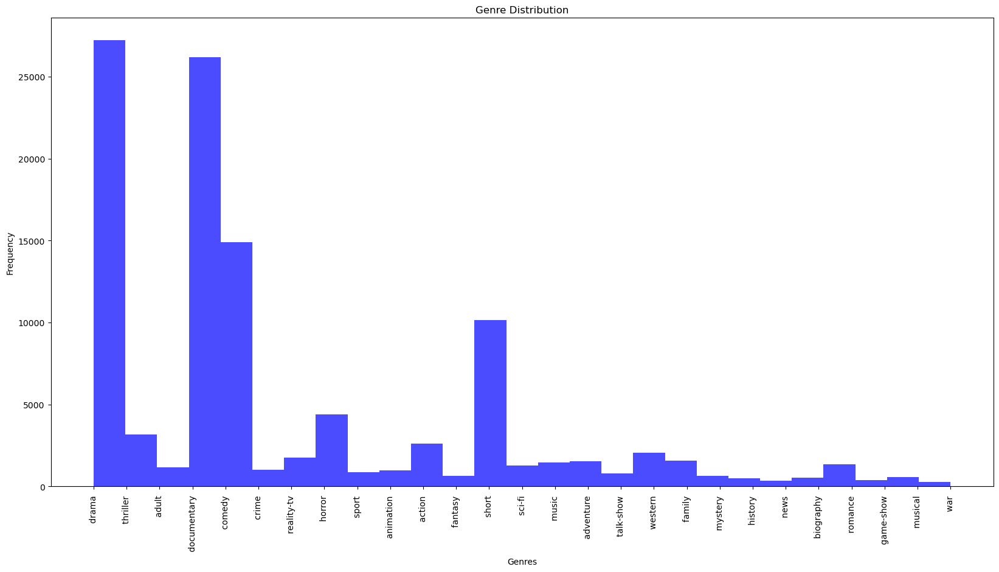

In [53]:
# Create a histogram of genre distribution
plt.figure(figsize=(20, 10))
plt.hist(df["Genre"],bins =27 , color='blue', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

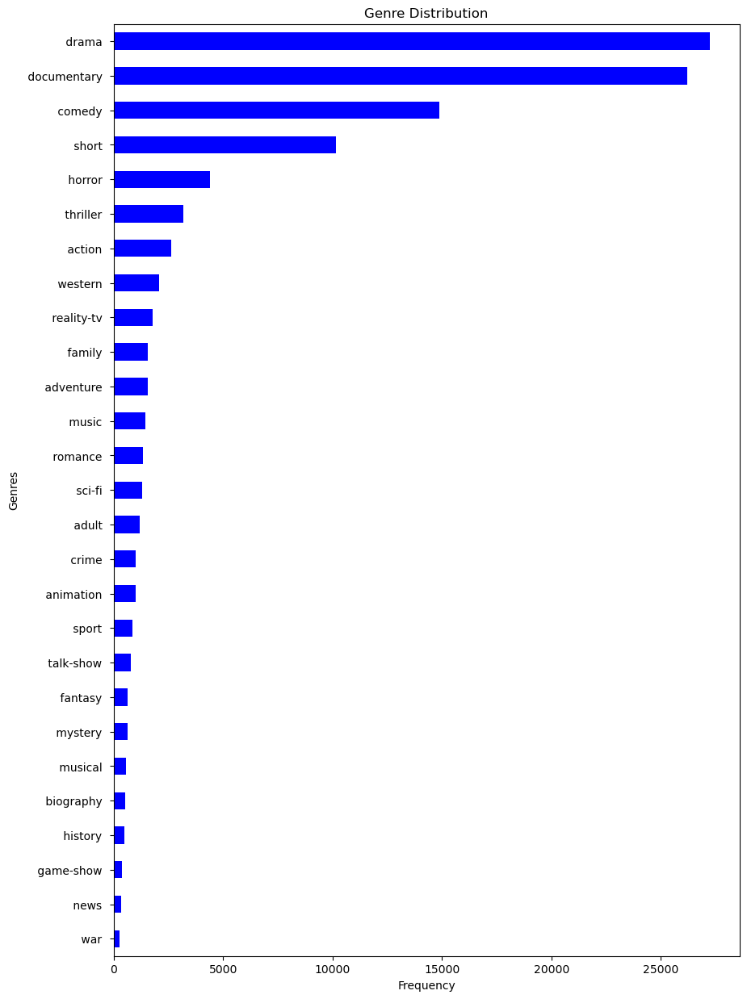

In [54]:
## View genre distribution on Horizontal graph

genre_counts = df["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)
# Create a horizontal histogram of genre distribution
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

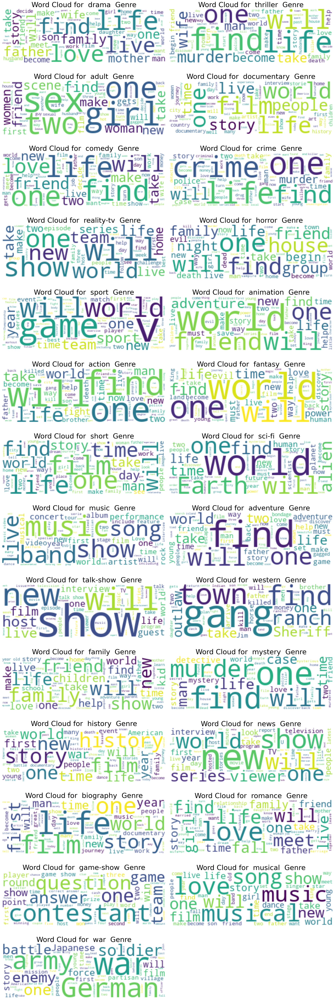

In [55]:
## Below code will generate wordcloud of each genre

# Create a list of unique genres from the dataset
genres = df['Genre'].unique()

# Set the figure size outside the loop
plt.figure(figsize=(20, 60))

# Iterate over each genre
for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i)  # Assuming you have 14 rows and 2 columns for 28 genres
    text_subset = " ".join(list(df[df["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')

    
plt.tight_layout()
plt.show()

# 4. Feature Engineering

In [56]:
## remove id column from head 
data = df.drop(["Title","id"] , axis = 1) # will drop column 
data.head()

,Genre,Description,Despcription_clean
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


# 5. Model Selection & Training

In [57]:
## import necessary library for
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier 

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

#### Converting Genre into Numerical form

In [58]:
#Convert sentiment labels to numerical values for modeling
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names   

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [59]:
data.head()

,Genre,Description,Despcription_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


In [60]:
## Split the data
x = data["Despcription_clean"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

### Model training using CountVectorizer technique

In [61]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

Model Score on Training data 0.6388658291364584
Model Score on Training data 0.526721641116461
               precision    recall  f1-score   support

      action        0.04      0.60      0.07        85
       adult        0.01      0.75      0.02         8
   adventure        0.06      0.68      0.12        74
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00        25
      comedy        0.45      0.54      0.49      6245
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.57      0.70     20825
       drama        0.83      0.46      0.60     24446
      family        0.00      0.50      0.00         2
     fantasy        0.00      0.00      0.00         0
   game-show        0.12      0.96      0.21        24
     history        0.00      0.00      0.00         0
      horror        0.29      0.77      0.42       829
       music        0.07      0.84      0.14        61
     musical        0.01

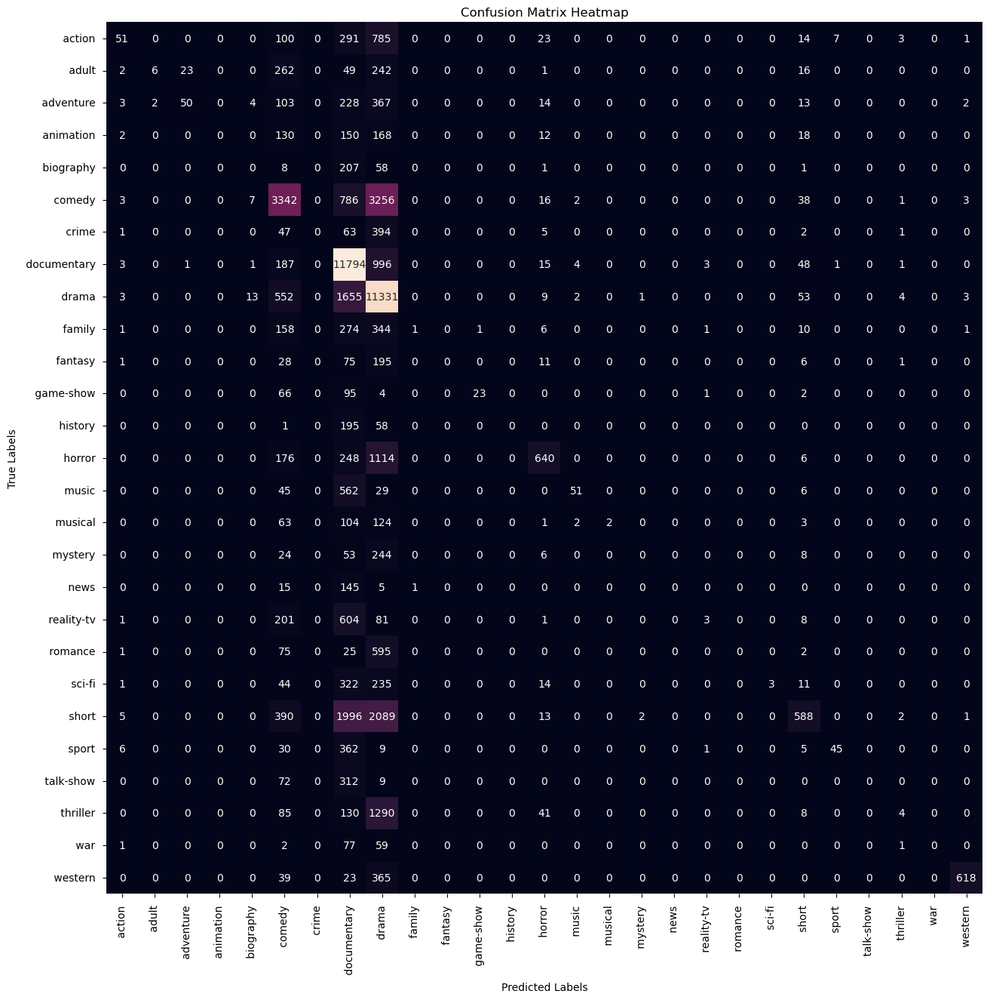

In [62]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)

print(classification_report(y_pred ,y_test))
 
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()    
    

### LogisticRegression

Model Score on Training data 0.9968454258675079
Model Score on Training data 0.5689486597671888
               precision    recall  f1-score   support

      action        0.33      0.41      0.37      1020
       adult        0.40      0.64      0.49       379
   adventure        0.22      0.41      0.29       413
   animation        0.17      0.37      0.23       217
   biography        0.01      0.08      0.01        24
      comedy        0.57      0.53      0.55      8014
       crime        0.08      0.20      0.12       216
 documentary        0.78      0.70      0.74     14513
       drama        0.69      0.56      0.62     16741
      family        0.16      0.33      0.21       387
     fantasy        0.10      0.27      0.14       114
   game-show        0.64      0.78      0.70       157
     history        0.01      0.08      0.02        38
      horror        0.58      0.63      0.60      2006
       music        0.53      0.60      0.56       619
     musical        0.0

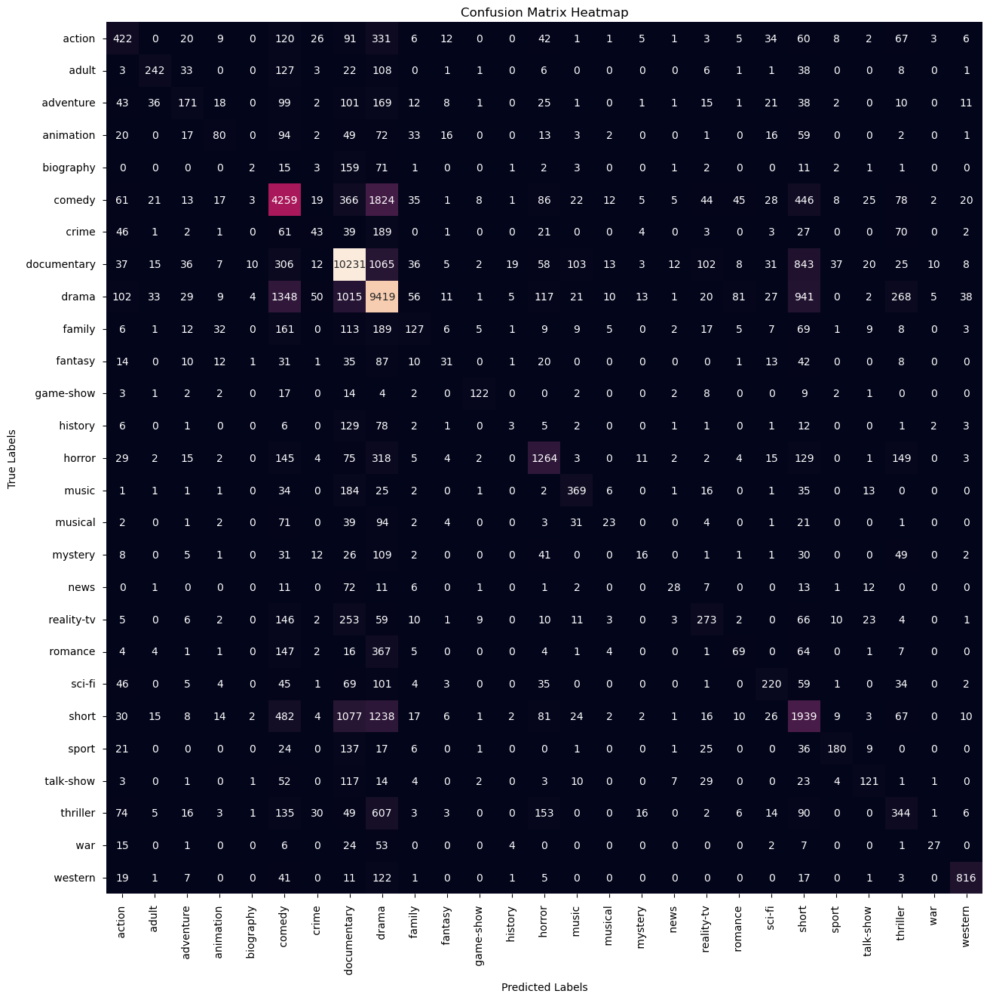

In [63]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### Support Vector Machine ( SVC )

Model Score on Training data 0.9994834615455569
Model Score on Training data 0.5185492648550926
               precision    recall  f1-score   support

      action        0.30      0.32      0.31      1184
       adult        0.39      0.52      0.45       460
   adventure        0.22      0.31      0.25       557
   animation        0.15      0.24      0.18       293
   biography        0.01      0.03      0.02       113
      comedy        0.51      0.50      0.50      7724
       crime        0.10      0.15      0.12       343
 documentary        0.72      0.69      0.71     13702
       drama        0.61      0.54      0.57     15231
      family        0.15      0.22      0.18       534
     fantasy        0.09      0.15      0.12       197
   game-show        0.62      0.67      0.64       176
     history        0.03      0.06      0.04       114
      horror        0.56      0.55      0.55      2235
       music        0.49      0.54      0.52       635
     musical        0.0

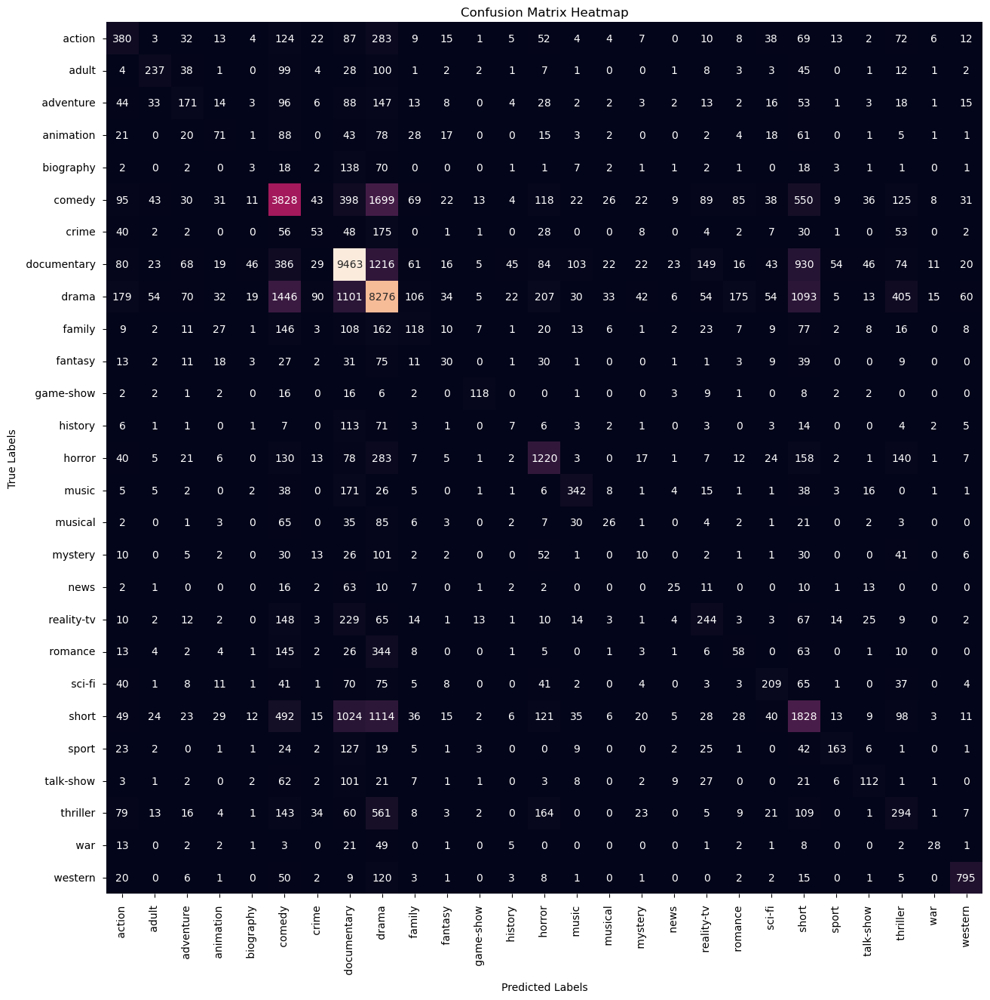

In [64]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### RandomForestClassifier

Random Forest - Train Score: 0.9994834615455569
Random Forest - Test Score: 0.49163392181821536
               precision    recall  f1-score   support

      action        0.01      0.72      0.02        18
       adult        0.07      0.62      0.13        68
   adventure        0.08      0.77      0.15        84
   animation        0.00      0.33      0.00         3
   biography        0.00      0.00      0.00         0
      comedy        0.26      0.57      0.36      3455
       crime        0.00      1.00      0.01         2
 documentary        0.89      0.56      0.69     21012
       drama        0.85      0.42      0.56     28023
      family        0.02      0.82      0.04        22
     fantasy        0.00      0.00      0.00         1
   game-show        0.41      0.89      0.56        88
     history        0.00      0.00      0.00         2
      horror        0.10      0.76      0.18       292
       music        0.14      0.83      0.24       119
     musical        0.0

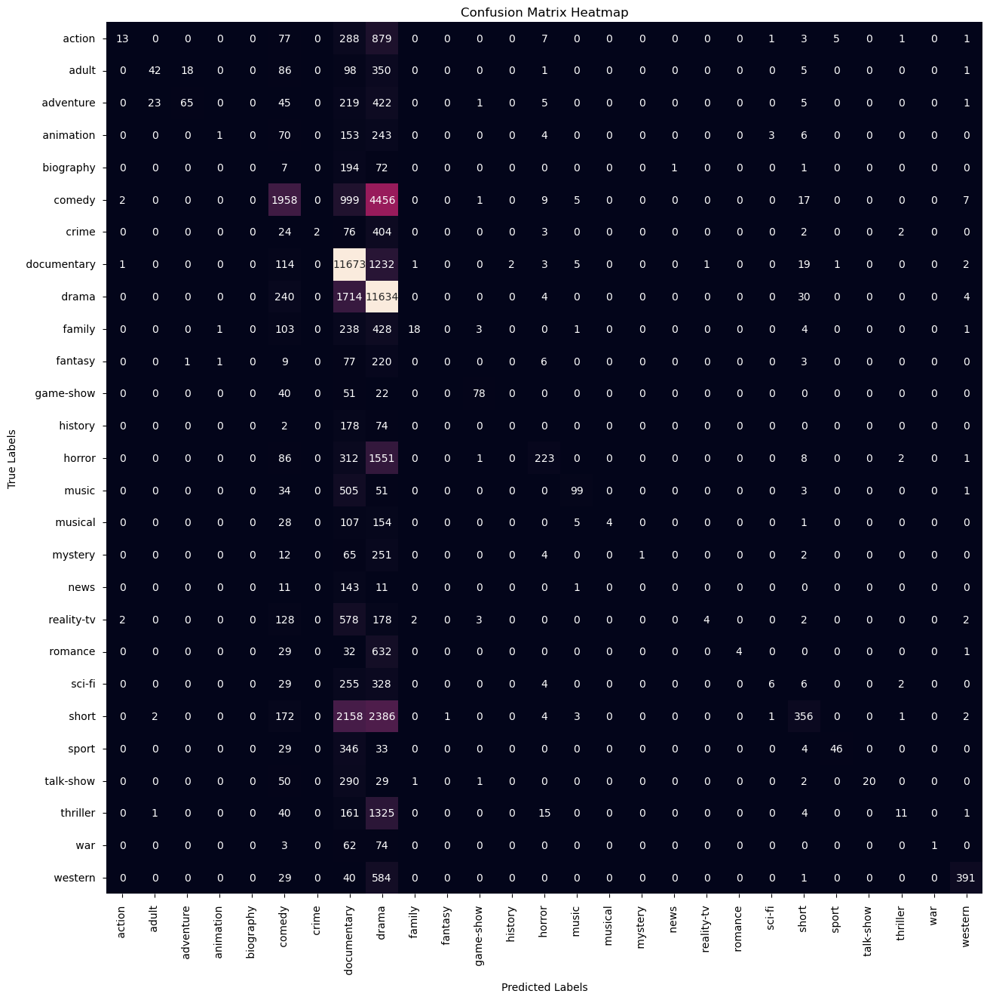

In [65]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train1, y_train)
print("Random Forest - Train Score:",random_forest.score(x_train1, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test1, y_test))

y_pred = random_forest.predict(x_test1)
print(classification_report(y_pred ,y_test))



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

###  TfidfVectorizer technique

In [66]:
## Using TfidfVectorizer technique
vectorizer = TfidfVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2 =  vectorize.transform(x_test)

MultinomialNB with TfidfVectorizer

Model Score on Training data 0.6388658291364584
Model Score on Training data 0.526721641116461
               precision    recall  f1-score   support

      action        0.04      0.60      0.07        85
       adult        0.01      0.75      0.02         8
   adventure        0.06      0.68      0.12        74
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00        25
      comedy        0.45      0.54      0.49      6245
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.57      0.70     20825
       drama        0.83      0.46      0.60     24446
      family        0.00      0.50      0.00         2
     fantasy        0.00      0.00      0.00         0
   game-show        0.12      0.96      0.21        24
     history        0.00      0.00      0.00         0
      horror        0.29      0.77      0.42       829
       music        0.07      0.84      0.14        61
     musical        0.01

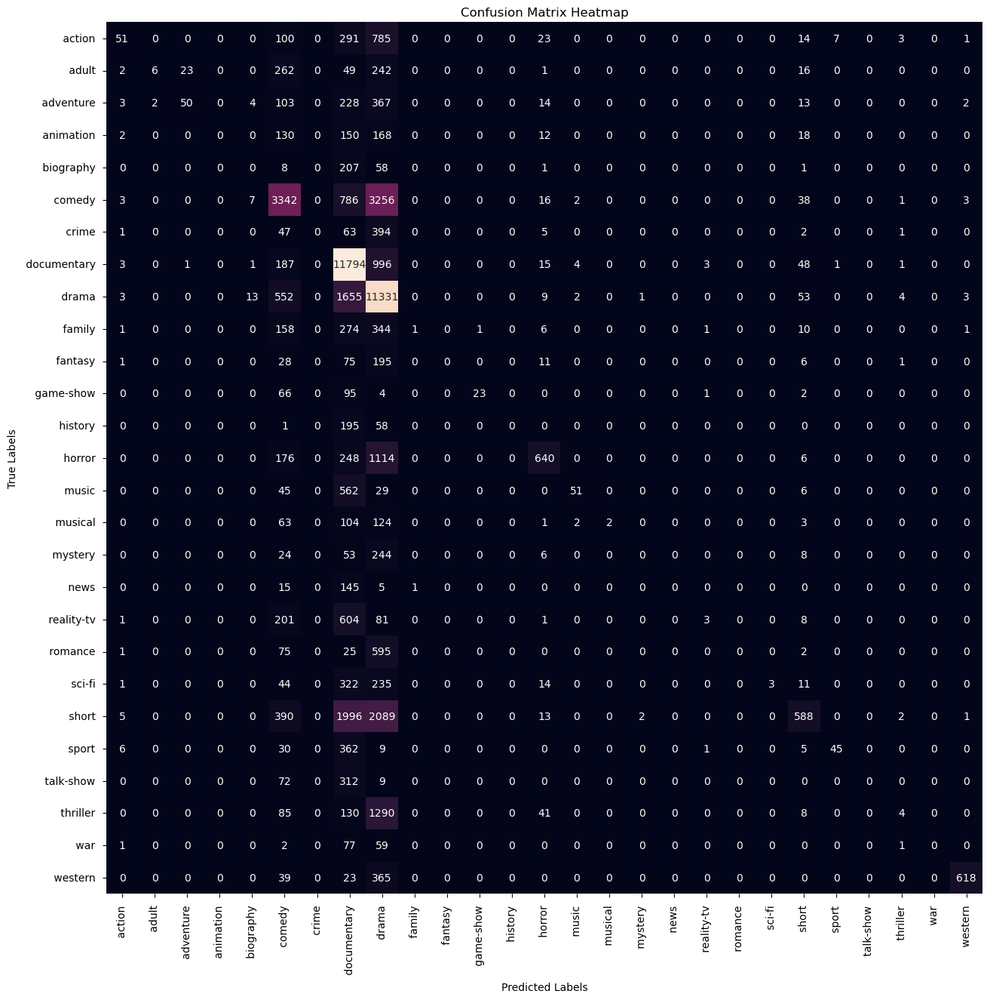

In [67]:
mnb = MultinomialNB()
mnb.fit(x_train2 ,y_train)
print("Model Score on Training data",mnb.score(x_train2 ,y_train))
print("Model Score on Training data",mnb.score(x_test2 ,y_test))
y_pred = mnb.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### LogisticRegression with TfidfVectorizer

Model Score on Training data 0.9968454258675079
Model Score on Training data 0.5689486597671888
               precision    recall  f1-score   support

      action        0.33      0.41      0.37      1020
       adult        0.40      0.64      0.49       379
   adventure        0.22      0.41      0.29       413
   animation        0.17      0.37      0.23       217
   biography        0.01      0.08      0.01        24
      comedy        0.57      0.53      0.55      8014
       crime        0.08      0.20      0.12       216
 documentary        0.78      0.70      0.74     14513
       drama        0.69      0.56      0.62     16741
      family        0.16      0.33      0.21       387
     fantasy        0.10      0.27      0.14       114
   game-show        0.64      0.78      0.70       157
     history        0.01      0.08      0.02        38
      horror        0.58      0.63      0.60      2006
       music        0.53      0.60      0.56       619
     musical        0.0

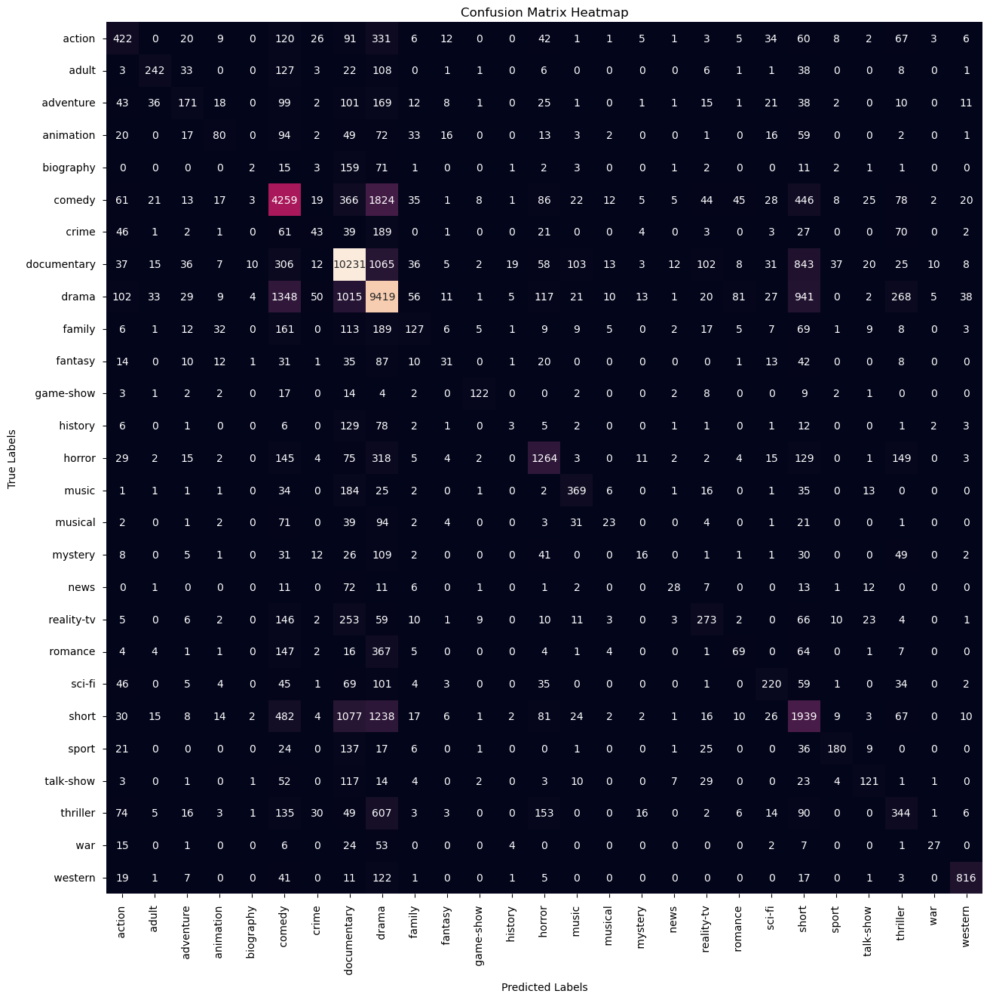

In [68]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train2 ,y_train)
print("Model Score on Training data",model.score(x_train2 ,y_train))
print("Model Score on Training data",model.score(x_test2 ,y_test))
y_pred = model.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### Support Vector Machine ( SVC ) with TfidfVectorizer

Model Score on Training data 0.9994834615455569
Model Score on Training data 0.5184939214492593
               precision    recall  f1-score   support

      action        0.30      0.32      0.31      1183
       adult        0.39      0.52      0.45       459
   adventure        0.22      0.31      0.25       557
   animation        0.15      0.24      0.18       293
   biography        0.01      0.03      0.02       113
      comedy        0.51      0.50      0.50      7724
       crime        0.10      0.15      0.12       343
 documentary        0.72      0.69      0.71     13699
       drama        0.61      0.54      0.57     15237
      family        0.15      0.22      0.18       534
     fantasy        0.09      0.15      0.12       197
   game-show        0.62      0.67      0.64       176
     history        0.03      0.06      0.04       114
      horror        0.56      0.55      0.55      2236
       music        0.49      0.54      0.52       635
     musical        0.0

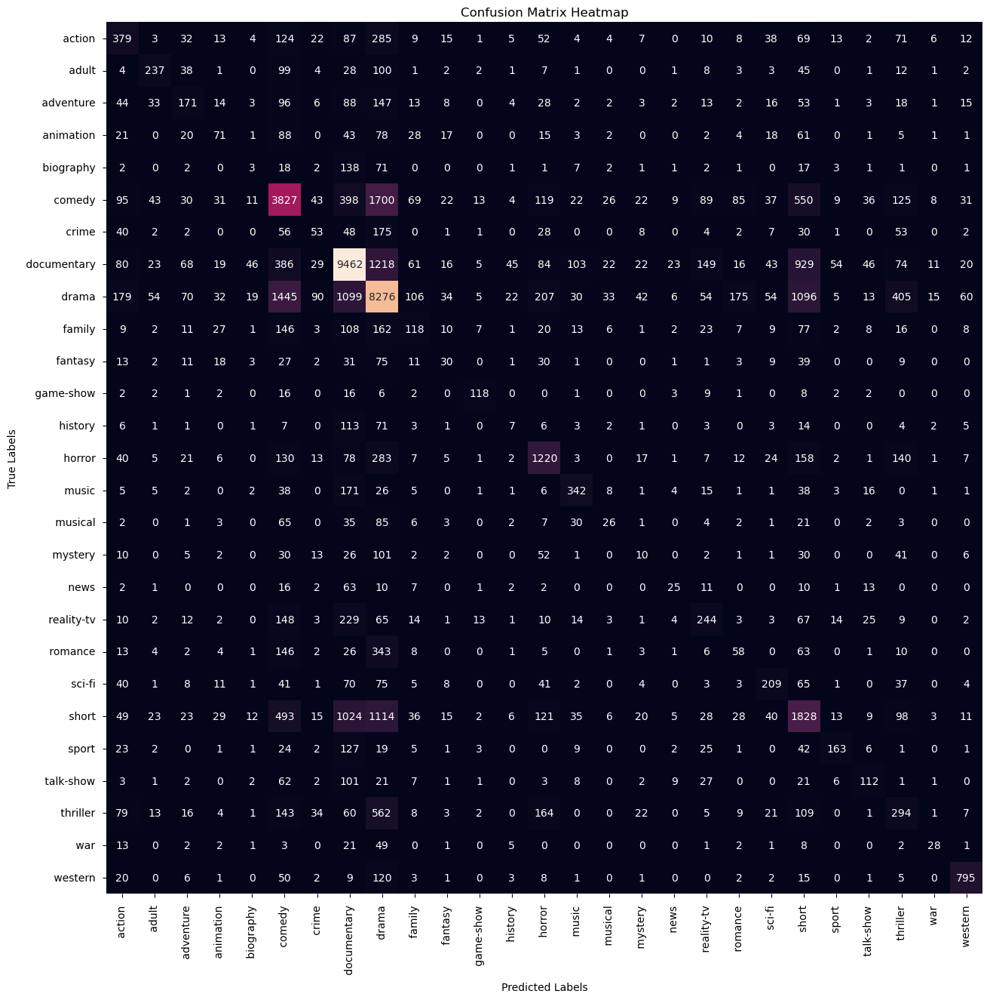

In [69]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

### RandomForestClassifier with TfidfVectorizer

Random Forest - Train Score: 0.9994834615455569
Random Forest - Test Score: 0.4903056800782187
               precision    recall  f1-score   support

      action        0.01      0.70      0.02        20
       adult        0.09      0.66      0.16        83
   adventure        0.08      0.78      0.15        82
   animation        0.00      0.50      0.00         2
   biography        0.00      0.00      0.00         0
      comedy        0.26      0.56      0.36      3443
       crime        0.00      1.00      0.01         2
 documentary        0.89      0.55      0.68     21041
       drama        0.85      0.41      0.56     28045
      family        0.02      0.93      0.03        15
     fantasy        0.00      0.00      0.00         1
   game-show        0.47      0.85      0.61       106
     history        0.00      0.00      0.00         2
      horror        0.11      0.73      0.20       335
       music        0.13      0.82      0.22       110
     musical        0.01

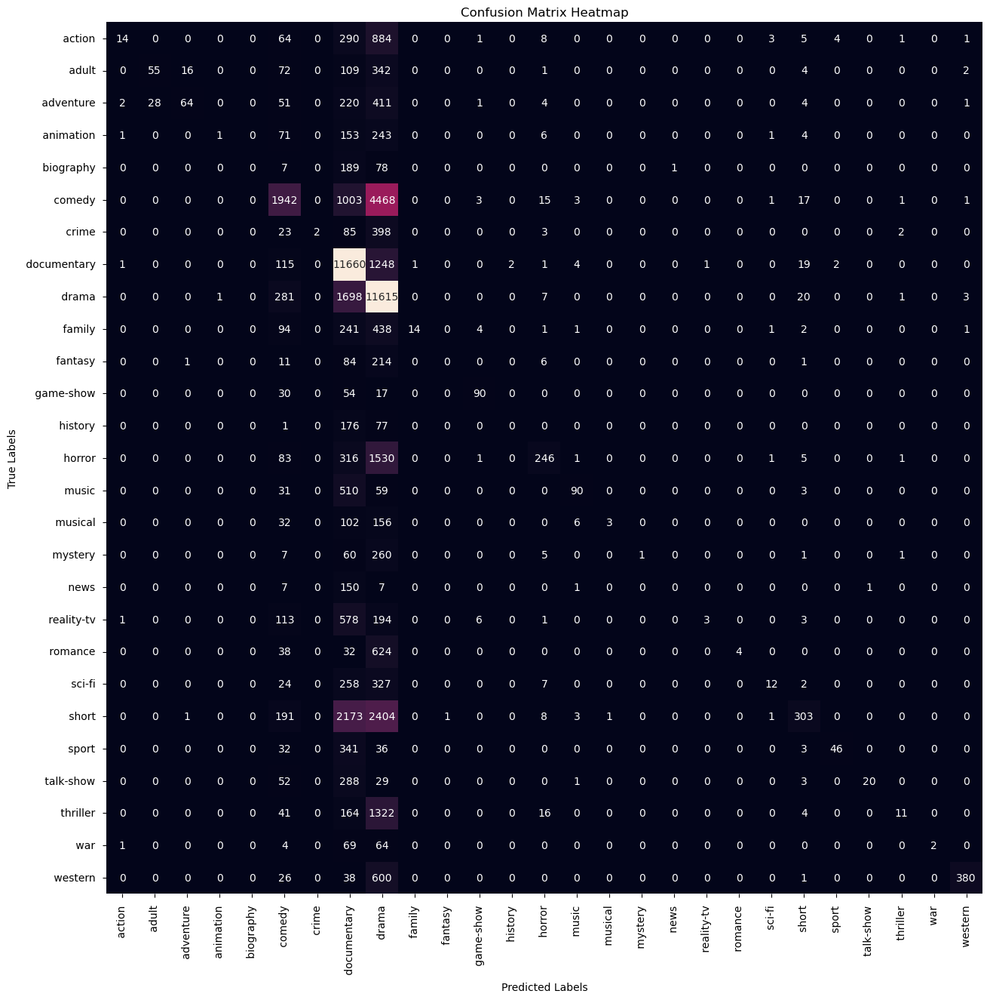

In [70]:
# Create a Random Forest model
random_forest = RandomForestClassifier()


# Fit the model with GridSearchCV
random_forest.fit(x_train2, y_train)


print("Random Forest - Train Score:",random_forest.score(x_train2, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test2, y_test))

y_pred = random_forest.predict(x_test2)
print(classification_report(y_pred ,y_test))



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()